# MODEL 3 - Custom ConvNet

In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os

import pandas as pd
import tensorflow as tf
import numpy as np
import tensorflow.keras as keras
from tensorflow.python.data import AUTOTUNE
from tensorflow.keras import layers as kl
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import callbacks as cb
import tensorflow_addons as tfa


if os.getcwd().startswith("/Users"): os.chdir(os.getcwd().split("/notebooks", 1)[0])

from src.config.notebook_config import NotebookConfig
from src.data.dataset import dataset_v2_loader as dataset_loader
from src.evaluation.evaluation import Evaluation

from src.data.utility.tf_dataset_transformer import TfDatasetTransformer

%load_ext autoreload
%autoreload 2

# Config

In [2]:
MODEL_NAME = "model_3"

config = NotebookConfig(MODEL_NAME)
DATASET_LOADER = dataset_loader # Dataset V2

BATCH_SIZE = 64

# Data Loading

In [3]:
train_dataset = DATASET_LOADER.load_train_v2()
val_dataset = DATASET_LOADER.load_validation_v2()

In [4]:
pair_tuples = list(map(lambda pair: (pair.image_a, pair.image_b, pair.similar), train_dataset.image_pairs))
pair_array = np.array(pair_tuples)


tf_dataset_transformer =  TfDatasetTransformer(image_shape=config.image_shape)

train_tf_dataset = tf_dataset_transformer.transform_to_tf_dataset(train_dataset, shuffle=True, shuffle_buffer_size=1024)\
                                         .cache("./tf_cache/train_dataset")\
                                         .batch(BATCH_SIZE)\
                                         .prefetch(AUTOTUNE)

val_tf_dataset = tf_dataset_transformer.transform_to_tf_dataset(val_dataset)\
                                         .cache("./tf_cache/val_dataset")\
                                         .batch(128)\
                                         .prefetch(AUTOTUNE)

2022-03-28 19:44:10.167728: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Model

In [35]:
def create_common_model() -> keras.Model:
    input = keras.Input(shape=config.image_shape.to_shape())
    x = kl.Conv2D(filters=64, kernel_size=7, strides=2, activation="relu", padding="valid")(input)
    x = kl.BatchNormalization()(x)
    x = kl.Dropout(0.2)(x)
    x = kl.MaxPool2D(pool_size=3)(x)
    x = kl.Conv2D(filters=96, kernel_size=5, strides=1, activation="relu", padding="valid")(x)
    x = kl.BatchNormalization()(x)
    x = kl.Dropout(0.2)(x)
    x = kl.MaxPool2D(pool_size=3)(x)
    x = kl.Flatten()(x)
    return keras.Model(inputs=input, outputs=x)

def create_model() -> keras.Model:
    input_a = keras.Input(shape=config.image_shape.to_shape())
    input_b = keras.Input(shape=config.image_shape.to_shape())

    common_model = create_common_model()

    layer_a = common_model(input_a)
    layer_b = common_model(input_b)

    merge_layer = tf.abs(tf.subtract(layer_a, layer_b))
    merge_layer = kl.Dropout(0.2)(merge_layer)
    merge_layer = kl.Dense(1, activation="sigmoid")(merge_layer)

    return keras.Model(inputs=[input_a, input_b], outputs=merge_layer, name=MODEL_NAME)

metric_f1 = tfa.metrics.f_scores.F1Score(num_classes=1, average="micro", name="f1-micro")
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.001, decay_steps=727, decay_rate=0.75)

model = create_model()
model.compile(
    optimizer=optimizers.Adam(learning_rate=lr_schedule), loss=losses.CategoricalHinge(), metrics=["accuracy", metric_f1])

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_17 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_5 (Functional)           (None, 9600)         163808      ['input_16[0][0]',               
                                                                  'input_17[0][0]']         

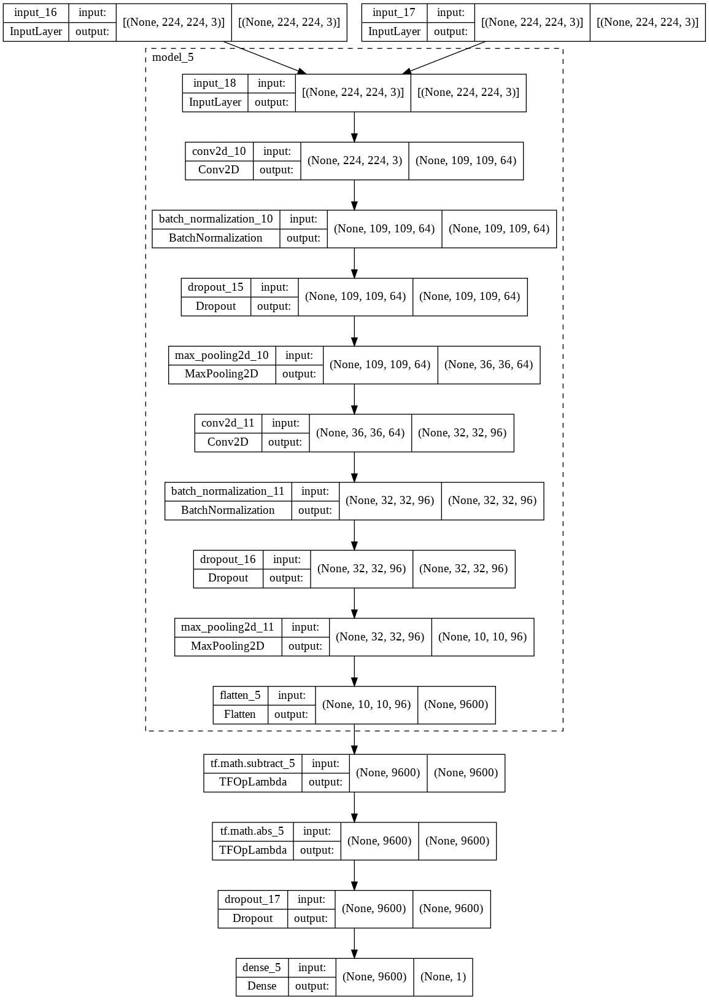

In [36]:
keras.utils.plot_model(model, show_shapes=True, expand_nested=True)

Epoch 1/20
726/726 [==============================] - 649s 895ms/step - loss: 0.5553 - accuracy: 0.9075 - f1-micro: 0.8356 - val_loss: 0.6882 - val_accuracy: 0.8879 - val_f1-micro: 0.7972
Epoch 2/20
726/726 [==============================] - 405s 558ms/step - loss: 0.5464 - accuracy: 0.9163 - f1-micro: 0.8548 - val_loss: 0.6905 - val_accuracy: 0.8828 - val_f1-micro: 0.8449
Epoch 3/20
726/726 [==============================] - 762s 1s/step - loss: 0.5387 - accuracy: 0.9239 - f1-micro: 0.8638 - val_loss: 0.6875 - val_accuracy: 0.8860 - val_f1-micro: 0.8421
Epoch 4/20
726/726 [==============================] - 759s 1s/step - loss: 0.5340 - accuracy: 0.9287 - f1-micro: 0.8670 - val_loss: 0.6901 - val_accuracy: 0.8807 - val_f1-micro: 0.8741
Epoch 5/20
726/726 [==============================] - 763s 1s/step - loss: 0.5321 - accuracy: 0.9306 - f1-micro: 0.8709 - val_loss: 0.6782 - val_accuracy: 0.8941 - val_f1-micro: 0.8706
Epoch 6/20
726/726 [==============================] - 760s 1s/step - 

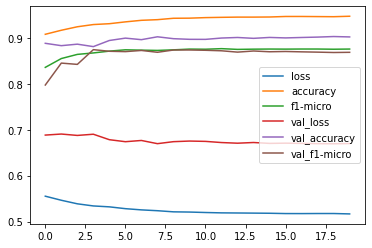

In [40]:
save_cb = cb.ModelCheckpoint(config.model_output_path, save_best_only=True)
tensorboard_cb = cb.TensorBoard(log_dir=config.tensorboard_log_dir)

history = model.fit(train_tf_dataset, epochs=20, workers=8, max_queue_size=20, validation_data=val_tf_dataset, callbacks=[save_cb, tensorboard_cb])

pd.DataFrame(history.history).plot()

In [ ]:
import gc
gc.collect(2)#%%

33302

# Evaluation

In [5]:
model: keras.Model = keras.models.load_model(config.saved_model_path)

In [6]:
evaluation = Evaluation(dataset=val_dataset, image_shape=config.image_shape, model=model)

42/42 [==============================] - 136s 3s/step
              precision    recall  f1-score   support

       False       0.87      0.92      0.90      4890
        True       0.93      0.89      0.91      5834

    accuracy                           0.90     10724
   macro avg       0.90      0.90      0.90     10724
weighted avg       0.90      0.90      0.90     10724

Regular pairs:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2681
        True       1.00      1.00      1.00      2681

    accuracy                           1.00      5362
   macro avg       1.00      1.00      1.00      5362
weighted avg       1.00      1.00      1.00      5362

Augmented pairs:
              precision    recall  f1-score   support

       False       0.74      0.82      0.78      2209
        True       0.86      0.80      0.83      3153

    accuracy                           0.81      5362
   macro avg       0.80      0.81      0.8

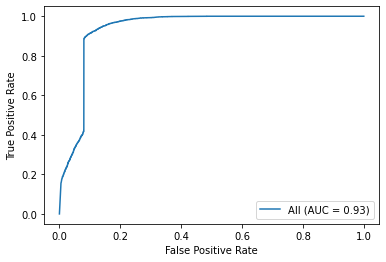

In [8]:
evaluation.print_f1_report(threshold=0.5)
evaluation.print_separate_f1_reports(threshold=0.5)
evaluation.plot_roc()

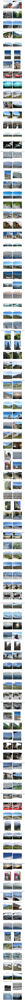

In [9]:
evaluation.show_images(range(8000, 8100))